## Clasificación con KNN (K-nearest neighbors)

In [205]:
import numpy as np 
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#### Funciones

Funciones de Normalización

In [206]:
# Normalización min-max
def min_max_normalizacion(df, column, min_value=0, max_value=1):
    # Obtiene los valores mínimos y máximos actuales de la columna
    min_val = df[column].min()
    max_val = df[column].max()

    # Normaliza la columna utilizando la fórmula de normalización min-max
    columna_normalizada = ((df[column] - min_val) / (max_val - min_val)) * (max_value - min_value)
    columna_normalizada = columna_normalizada + min_value

    return columna_normalizada

# Normalización z-score
def z_score_normalizacion(df, column):
    # Calcula la media y la desviación estándar de la columna especificada
    mean = df[column].mean()
    std_dev = df[column].std()

    # Aplica la normalización z-score a la columna
    columna_normalizada = (df[column] - mean)
    columna_normalizada = columna_normalizada / std_dev

    return columna_normalizada

# Normalización medias
def media_normalizacion(df, columna):
    # Obtenemos la media de la columna
    mean = df[columna].mean()
    min_value = df[columna].min()
    max_value = df[columna].max()
    
    # Normalizamos los valores de la columna utilizando la normalización por medias
    df[columna] = (df[columna] - mean)/(max_value - min_value)
    
    return df[columna]

# Normalización por vector unitario
def vector_unitario_normalizacion(df, columna):
    # Obtenemos los valores de la columna
    column_values = df[columna].values
    
    # Calculamos la norma del vector de la columna
    vector_norm = np.sqrt(np.sum(column_values**2))
    
    # Normalizamos los valores de la columna utilizando la normalización por vector unitario
    df[columna] = column_values / vector_norm
    
    return df[columna]

# Normalización por sigmoide
def sigmoide_normalizacion(df, columna):
    # Obtenemos los valores de la columna
    column_values = df[columna].values
    
    # Calculamos la media y la desviación estándar de los valores de la columna
    mean = np.mean(column_values)
    std = np.std(column_values)
    
    # Normalizamos los valores de la columna utilizando la normalización por sigmoide
    df[columna] = 1 / (1 + np.exp(-(column_values - mean) / std))
    
    return df[columna]

Función para graficar distribución

In [207]:
# Función para graficar distribución
def GraficarDistribucionPlotly(dataframe, filas_columnas, alto, ancho, nbinsx=10):
    fig = make_subplots(rows=filas_columnas, cols=filas_columnas, subplot_titles=dataframe.columns)

    for i, col in enumerate(dataframe.columns):
        ax = i//filas_columnas + 1
        ay = i%filas_columnas + 1
        fig.add_trace(go.Histogram(x=dataframe[col], nbinsx=nbinsx, name=col), ax, ay)
        
    fig.update_layout(title='Histogramas de cada columna', height=alto, width=ancho, showlegend=False)
    
    return fig.show()

Funciones para crear datos sintéticos

In [208]:
import random

def MetodoRuleta(df, cantidad):
    nuevosdatos = []
    for n in range(cantidad):
        fila = []
        for column in df.columns:
            item_counts_key = df[column].value_counts().index.tolist()
            item_counts = df[column].value_counts(normalize=True)
            cumsumP = item_counts.cumsum()
            w = cumsumP.to_numpy()
            r = random.random()
            magico = np.argwhere(r <= w)
            x = int(magico[0])
            dato = item_counts_key[x]
            fila.append(dato)
            
        nuevosdatos.append(fila)
        
    df_new = pd.DataFrame(nuevosdatos, columns=df.columns)
    return df_new  

Función KNN

In [209]:
from collections import Counter

class KNN:
    def __init__(self, k):
        self.k = k

    # Entrenar el modelo: para KNN, esto sólo implica almacenar los datos de entrenamiento
    def fit(self, X, y):
        self.X_train = X
        self.y_train = y

    # Predecir las clases para un conjunto de datos de prueba
    def predict(self, X):
        predicted_labels = [self._predict(x) for x in X]
        return np.array(predicted_labels)

    # Predecir la clase de un único ejemplo de prueba
    def _predict(self, x):
        # Calcular las distancias entre x y todos los ejemplos en el conjunto de entrenamiento
        distances = [np.linalg.norm(x - x_train) for x_train in self.X_train]

        # Ordenar por distancia y devolver los índices de las primeras k muestras
        k_indices = np.argsort(distances)[:self.k]

        # Extraer las etiquetas de los k vecinos más cercanos
        k_nearest_labels = [self.y_train[i] for i in k_indices]

        # Devolver la clase más común entre los k vecinos más cercanos
        most_common = Counter(k_nearest_labels).most_common(1)
        return most_common[0][0]

PCA

In [210]:
# Función que calcula PCA
def PCA(dataframe, num_componentes):
    # 1. Restar la media a cada columna (de esta manera el conjunto de datos se centra en el origen)
    media = np.mean(dataframe, axis=0)
    centered_dataframe = dataframe - media
    
    # 2. Calcular la matriz de covarianza
    cov_mat = np.cov(centered_dataframe.T)
    
    # 3. Calcular eigenvalores y eigenvectores de la matriz de covarianza
    eigenvalores, eigenvectores = np.linalg.eig(cov_mat)
    
    # 4. Ordenar los eigenvectores según sus eigenvalores (de mayor a menor)
    # Un eigenvector más grande significa que tiene más información sobre la variación de los datos
    indices_ord = np.argsort(eigenvalores)[::-1]
    eigenvectores_ord = eigenvectores[:, indices_ord]
    
    # 5. Seleccionar los primeros num_componentes eigenvectores
    componentes_principales = eigenvectores_ord[:, 0:num_componentes]
    
    # 6. Transformar el conjunto de datos original
    dataframe_transformado = np.dot(centered_dataframe, componentes_principales)
    
    # Convertir el array en un dataframe
    dataframe_transformado = pd.DataFrame(dataframe_transformado)
    
    return dataframe_transformado

#### Cargar Dataset y realizar Data Augmentation

In [211]:
df = pd.read_csv(r'C:\Users\USER\OneDrive\Escritorio\Maestría\Materias_Maestría\Machine_Learning\Dataset_Students_Success\dataset.csv')
df.head(5)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


Revisar el balance de clases

In [212]:
colores = {"Graduate": 'green', "Dropout": 'orange', "Enrolled": 'blue'}
frecuencias = df['Target'].value_counts()

fig = go.Figure(go.Bar(x=frecuencias.index, y=frecuencias.values, marker_color=[colores.get(x) for x in frecuencias.index]))
fig.update_layout(title='Balance de las Clases', height=500, width=900, xaxis_title='Categorías', yaxis_title='Frecuencia')

Se sabe de antemano que no hay valores nulos ni datos faltantes en el dataset, por lo que se procede a la generación de datos sintéticos para balancear las clases

Los datos sintéticos se generarán usando el método ruleta para cada clase, es decir, la probabilidad que aparezca un valor en un atributo dependerá de la clase a la que pertenece

In [213]:
df_dropout = df.loc[df["Target"] == "Dropout"]
df_enrolled = df.loc[df["Target"] == "Enrolled"]

In [214]:
df_dropout.head(5)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0.0,0,10.8,1.4,1.74,Dropout
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0.0,0,10.8,1.4,1.74,Dropout
7,1,9,4,11,1,1,1,22,27,10,...,0,5,5,0,0.0,0,15.5,2.8,-4.06,Dropout
9,1,1,1,10,1,1,1,1,14,5,...,0,6,14,2,13.5,0,8.9,1.4,3.51,Dropout
12,1,1,2,16,1,1,1,13,27,5,...,0,6,0,0,0.0,0,12.7,3.7,-1.70,Dropout


In [215]:
df_enrolled.head(5)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
16,1,9,1,10,1,1,1,13,28,6,...,0,6,14,2,11.000,0,10.8,1.4,1.74,Enrolled
19,1,1,1,16,1,1,1,13,14,8,...,0,7,8,6,13.500,0,16.2,0.3,-0.92,Enrolled
21,1,9,4,13,1,1,1,1,28,5,...,0,8,9,8,11.425,0,12.7,3.7,-1.70,Enrolled
25,1,1,1,10,1,1,1,13,28,10,...,0,6,12,4,11.000,0,7.6,2.6,0.32,Enrolled
27,1,1,1,6,1,1,1,13,14,4,...,0,5,7,4,13.000,0,9.4,-0.8,-3.12,Enrolled


Obtener los datos únicos de cada atributo en cada dataframe

In [216]:
datos_unicos_dropout = []

for columna in df_dropout.columns:
    unicos = df_dropout[columna].unique()
    datos_unicos_dropout.append(unicos)
    
datos_unicos_dropout

[array([1, 2, 4, 3, 5, 6], dtype=int64),
 array([ 8,  1,  9, 12, 14, 15,  4, 13,  6, 17, 16,  3,  2,  5,  7, 10, 11],
       dtype=int64),
 array([5, 4, 1, 2, 3, 6], dtype=int64),
 array([ 2,  5, 11, 10, 16, 15,  1,  7,  9,  8, 17, 12,  4,  6,  3, 13, 14],
       dtype=int64),
 array([1, 0], dtype=int64),
 array([ 1,  8, 14,  3, 15, 12,  2,  4, 16, 17,  7,  6,  9,  5, 11, 13, 10],
       dtype=int64),
 array([ 1,  3, 14, 18,  9, 16, 10, 21, 12, 17,  8,  7, 19], dtype=int64),
 array([13, 22,  1, 23, 19,  4,  3, 10,  5, 18,  7,  2, 24, 11, 20,  6,  9,
        26,  8, 27, 21, 12, 28, 17, 25, 16, 29], dtype=int64),
 array([10, 27, 14,  4,  3, 28,  1, 24,  2,  9, 29,  5, 26, 18, 15, 25, 31,
        16, 11, 20, 12,  7, 13,  8,  6, 30, 21, 17, 34, 23, 19, 22],
       dtype=int64),
 array([ 6, 10,  5,  1,  7,  4,  3,  8, 12,  9,  2, 13, 32, 28, 15, 11, 19,
        31], dtype=int64),
 array([10,  8,  4,  7,  1,  3,  6, 11,  5,  9,  2, 12, 13, 44, 31, 16, 17,
        45], dtype=int64),
 array([1

In [217]:
datos_unicos_enrolled = []

for columna in df_enrolled.columns:
    unicos = df_enrolled[columna].unique()
    datos_unicos_enrolled.append(unicos)
    
datos_unicos_enrolled

[array([1, 3, 4, 2, 5, 6], dtype=int64),
 array([ 9,  1,  8, 15, 14, 12,  6, 16,  7,  3, 13, 17,  4], dtype=int64),
 array([1, 4, 2, 3, 6, 5, 9], dtype=int64),
 array([10, 16, 13,  6, 12,  4,  9, 17, 15,  2,  5, 11,  7, 14,  3,  8,  1],
       dtype=int64),
 array([1, 0], dtype=int64),
 array([ 1, 14, 15, 12, 16,  6,  3,  4,  9,  2, 13], dtype=int64),
 array([ 1, 12,  8,  3, 13, 14, 16, 20, 15, 19, 11,  9], dtype=int64),
 array([13,  1,  3,  4, 23, 22,  2, 24, 25,  5, 28, 19, 10], dtype=int64),
 array([28, 14,  3,  5,  1, 27,  2,  4, 29, 10, 31, 24, 21], dtype=int64),
 array([ 6,  8,  5, 10,  4,  2,  7,  3, 28,  9, 29, 23, 32, 30, 18, 24, 19,
        11, 21, 15, 27, 14, 20, 13, 22, 17,  1], dtype=int64),
 array([ 9,  8, 10,  4, 11,  3,  7,  6,  5,  2, 19, 39, 34, 44, 24, 35, 26,
         1, 36, 43, 16, 31, 42, 20, 37, 29, 13, 25, 21, 40, 17, 15, 41],
       dtype=int64),
 array([1, 0], dtype=int64),
 array([0, 1], dtype=int64),
 array([0, 1], dtype=int64),
 array([1, 0], dtype=int64),


Cantidad total de datos a crear para cada clase

In [218]:
# Contar cada clase
prueba = df['Target'].value_counts()

# Cantidad a crear para cada clase
cantidad_dropout = prueba[0] - prueba[1]
cantidad_enrolled = prueba[0] - prueba[2]

print ("Cantidad de datos a crear ")
print("Dropout: ", cantidad_dropout)
print("Enrolled: ", cantidad_enrolled)

Cantidad de datos a crear 
Dropout:  788
Enrolled:  1415


Generar datos sintéticos para clase "Dropout"

In [219]:
news_dropout = MetodoRuleta(df_dropout, cantidad_dropout)

news_dropout

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,12,1,14,1,1,1,1,3,5,...,8,7,0,0,0.000000,0,9.4,0.3,1.74,Dropout
1,1,1,1,11,1,1,1,3,27,10,...,0,9,5,0,0.000000,0,9.4,1.4,0.32,Dropout
2,1,1,1,9,1,1,1,19,27,10,...,0,7,10,2,0.000000,0,8.9,0.6,2.02,Dropout
3,4,1,2,13,1,14,1,1,1,10,...,0,7,0,4,12.142857,0,11.1,3.7,1.74,Dropout
4,2,1,1,7,1,12,1,19,27,10,...,0,6,11,1,10.666667,0,16.2,0.5,-3.12,Dropout
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,1,1,1,2,1,1,1,1,14,6,...,0,6,13,0,12.333333,0,9.4,-0.8,1.74,Dropout
784,1,9,1,6,1,1,1,1,27,3,...,0,5,0,0,10.000000,0,8.9,-0.8,2.02,Dropout
785,1,1,1,13,1,14,1,13,27,10,...,0,5,7,0,12.000000,0,12.4,2.6,3.51,Dropout
786,1,13,1,11,1,1,1,3,14,8,...,0,5,12,0,12.250000,0,9.4,2.6,0.32,Dropout


Generar datos sintéticos para clase "Enrolled"

In [220]:
news_enrolled = MetodoRuleta(df_enrolled, cantidad_enrolled)

news_enrolled

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,1,1,17,1,1,1,2,1,8,...,0,6,9,3,13.500000,0,12.4,0.5,1.74,Enrolled
1,1,8,2,12,0,14,1,13,27,8,...,0,6,9,6,12.500000,0,8.9,3.7,1.74,Enrolled
2,1,12,1,6,1,1,1,23,14,4,...,0,6,8,6,13.000000,0,10.8,-0.8,0.32,Enrolled
3,1,1,6,9,1,1,1,23,28,5,...,0,6,12,3,11.800000,0,12.4,3.7,0.32,Enrolled
4,1,1,1,12,1,14,1,1,28,10,...,0,5,11,4,10.333333,0,11.1,2.6,-3.12,Enrolled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1410,1,12,1,4,1,16,1,24,14,8,...,0,0,8,2,13.285714,0,10.8,0.3,-4.06,Enrolled
1411,1,17,1,12,0,1,1,1,1,6,...,0,6,9,4,0.000000,0,10.8,1.4,0.32,Enrolled
1412,1,1,1,12,1,1,1,23,28,23,...,0,6,12,5,0.000000,3,9.4,0.6,0.79,Enrolled
1413,1,1,1,12,1,1,1,1,27,10,...,0,6,10,0,11.200000,0,10.8,-0.3,2.02,Enrolled


Agregar los nuevos datos al dataframe principal

In [221]:
df_new = pd.concat([df, news_dropout, news_enrolled], ignore_index=True)
df_new

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6622,1,12,1,4,1,16,1,24,14,8,...,0,0,8,2,13.285714,0,10.8,0.3,-4.06,Enrolled
6623,1,17,1,12,0,1,1,1,1,6,...,0,6,9,4,0.000000,0,10.8,1.4,0.32,Enrolled
6624,1,1,1,12,1,1,1,23,28,23,...,0,6,12,5,0.000000,3,9.4,0.6,0.79,Enrolled
6625,1,1,1,12,1,1,1,1,27,10,...,0,6,10,0,11.200000,0,10.8,-0.3,2.02,Enrolled


Comparar dataset original con el nuevo

In [222]:
frecuencias_original = df['Target'].value_counts()
frecuencias_nuevo = df_new['Target'].value_counts()

fig = make_subplots(rows=1, cols=2, subplot_titles=["Original", "Nuevo"])
fig.add_trace(go.Bar(x=frecuencias_original.index, y=frecuencias_original.values, marker_color=[colores.get(x) for x in frecuencias_original.index]), 1, 1)
fig.add_trace(go.Bar(x=frecuencias_nuevo.index, y=frecuencias_nuevo.values, marker_color=[colores.get(x) for x in frecuencias_nuevo.index]), 1, 2)

Se debe revisar que las distribuciones generadas sean lo más parecidas posibles a las originales

##### Distribuciones Originales

In [223]:
fig = make_subplots(rows=6, cols=6, subplot_titles=df.columns)

for i, col in enumerate(df.columns):
    ax = i//6 + 1
    ay = i%6 + 1
    fig.add_trace(go.Histogram(x=df[col], name=col), ax, ay)
    
fig.update_layout(title='Histogramas de cada columna', height=900, width=1400, showlegend=False)
fig.update_annotations(font_size=10)

##### Distribuciones Nuevas

In [224]:
fig = make_subplots(rows=6, cols=6, subplot_titles=df_new.columns)

for i, col in enumerate(df_new.columns):
    ax = i//6 + 1
    ay = i%6 + 1
    fig.add_trace(go.Histogram(x=df_new[col], name=col), ax, ay)
    
fig.update_layout(title='Histogramas de cada columna', height=900, width=1400, showlegend=False)
fig.update_annotations(font_size=10)

##### Por último confirmar que las desviaciones estándar se mantengan similares...

##### Original

In [225]:
df_std = df.iloc[:,:-1].std()
df_std

Marital status                                     0.605747
Application mode                                   5.298964
Application order                                  1.313793
Course                                             4.331792
Daytime/evening attendance                         0.311897
Previous qualification                             3.963707
Nacionality                                        1.748447
Mother's qualification                             9.026251
Father's qualification                            11.044800
Mother's occupation                                3.997828
Father's occupation                                4.856692
Displaced                                          0.497711
Educational special needs                          0.106760
Debtor                                             0.317480
Tuition fees up to date                            0.324235
Gender                                             0.477560
Scholarship holder                      

##### Nueva

In [226]:
df_std_new = df_new.iloc[:,:-1].std()
df_std_new

Marital status                                     0.615158
Application mode                                   5.339735
Application order                                  1.282236
Course                                             4.382765
Daytime/evening attendance                         0.313295
Previous qualification                             4.096362
Nacionality                                        1.803104
Mother's qualification                             9.032660
Father's qualification                            11.067003
Mother's occupation                                4.059123
Father's occupation                                5.193116
Displaced                                          0.498618
Educational special needs                          0.109887
Debtor                                             0.324590
Tuition fees up to date                            0.335412
Gender                                             0.485636
Scholarship holder                      

#### Normalizar

Se puede observar en el último histograma generado, que los valores de cada atributo se encuentran en rangos diferentes, es por esto que es necesario normalizar los datos para obtener mejores métricas al clasificar con KNN. Se usará normalización min-max.

In [227]:
df_norm = df_new.copy()

for column in df_norm.iloc[:,:-1].columns:
    df_norm[column] = min_max_normalizacion(df_norm, column)

df_norm.head(5)

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,0.0,0.411765,0.555556,0.0625,1.0,0.0,0.0,0.428571,0.272727,0.161290,...,0.0,0.00000,0.000000,0.00,0.000000,0.0,0.372093,0.488889,0.766182,Dropout
1,0.0,0.294118,0.111111,0.6250,1.0,0.0,0.0,0.000000,0.060606,0.096774,...,0.0,0.26087,0.181818,0.30,0.735897,0.0,0.732558,0.111111,0.640687,Graduate
2,0.0,0.000000,0.555556,0.2500,1.0,0.0,0.0,0.750000,0.787879,0.290323,...,0.0,0.26087,0.000000,0.00,0.000000,0.0,0.372093,0.488889,0.766182,Dropout
3,0.0,0.411765,0.222222,0.8750,1.0,0.0,0.0,0.785714,0.787879,0.161290,...,0.0,0.26087,0.303030,0.25,0.667692,0.0,0.209302,0.000000,0.124174,Graduate
4,0.2,0.647059,0.111111,0.1250,0.0,0.0,0.0,0.750000,0.818182,0.290323,...,0.0,0.26087,0.181818,0.30,0.700000,0.0,0.732558,0.111111,0.640687,Graduate


Nuevas Distribuciones

In [228]:
fig = make_subplots(rows=6, cols=6, subplot_titles=df_norm.columns)

for i, col in enumerate(df_norm.columns):
    ax = i//6 + 1
    ay = i%6 + 1
    fig.add_trace(go.Histogram(x=df_norm[col], name=col), ax, ay)
    
fig.update_layout(title='Histogramas de cada columna', height=900, width=1400, showlegend=False)
fig.update_annotations(font_size=10)

#### Clasificación con KNN

Se sabe que KNN es sensible a la alta dimensionalidad, por lo que se aplicará PCA

In [229]:
# Reducir dimensionalidad
df_pca = PCA(df_norm.iloc[:,:-1], 3)

# Guardar última columna
last_column = df_norm.iloc[:, -1]

# Agregar la última columna al dataframe reducido
df_pca['Target'] = last_column

df_pca

,0,1,2,Target
0,0.260328,-1.022572,-0.129104,Dropout
1,0.115660,-0.868000,0.068382,Graduate
2,0.350699,-0.984694,-0.479058,Dropout
3,-0.575602,0.027518,-0.253796,Graduate
4,0.363067,0.847603,-0.204487,Graduate
...,...,...,...,...
6622,0.850171,0.014208,0.319672,Enrolled
6623,0.168414,0.747952,0.198006,Enrolled
6624,-0.497535,-0.086735,-0.425014,Enrolled
6625,0.548733,-0.074863,0.502661,Enrolled


Dividir dataframe en entrenamiento y test (80-20)

In [230]:
from sklearn.model_selection import train_test_split

seed = 42
df_pca_ent, df_pca_test = train_test_split(df_pca, test_size=0.2, random_state=seed)

Calcular el mejor valor de K

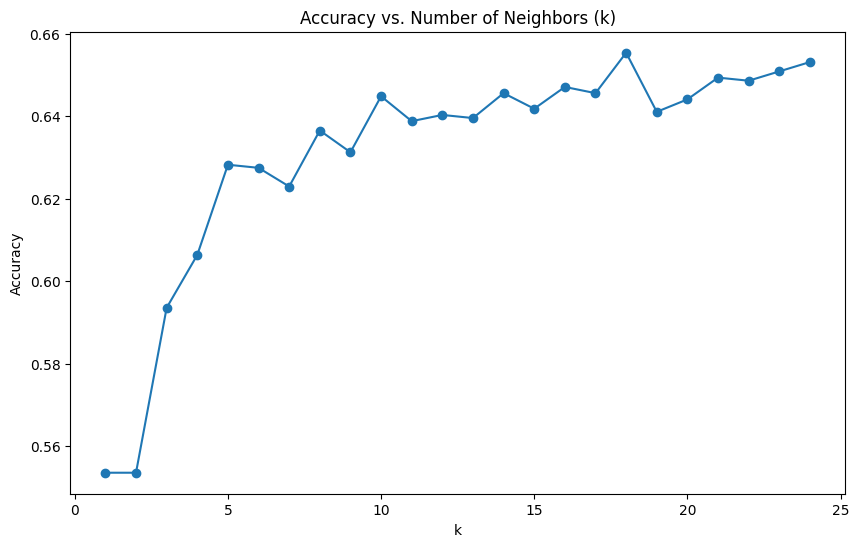

In [231]:
from sklearn.metrics import accuracy_score, f1_score, recall_score
import matplotlib.pyplot as plt

# Lista para guardar los resultados
results = []

# Valores de k a probar
k_values = range(1, 25)

for k in k_values:
    # Modelo KNN
    knn = KNN(k)
    knn.fit(df_pca_ent.iloc[:,:-1].values, df_pca_ent["Target"].values)

    # Hacer predicciones sobre los datos de prueba
    predictions = knn.predict(df_pca_test.iloc[:,:-1].values)

    # Calcular la precisión del modelo
    accuracy = accuracy_score(df_pca_test["Target"].values, predictions)

    # Guardar la precisión en la lista de resultados
    results.append(accuracy)

# Grafica los resultados
plt.figure(figsize=(10, 6))
plt.plot(k_values, results, marker='o')
plt.xlabel('k')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Number of Neighbors (k)')
plt.show()


Predicción con KNN de los datos de test

In [234]:
# Crear instancias del modelo KNN y entrenarlo
k = 18
knn = KNN(k)
knn.fit(df_pca_ent.iloc[:,:-1].values, df_pca_ent["Target"].values)

# Predecir las clases de algunos ejemplos de prueba
predictions = knn.predict(df_pca_test.iloc[:,:-1].values)

print(predictions)

['Dropout' 'Dropout' 'Graduate' ... 'Graduate' 'Dropout' 'Graduate']


Revisar el rendimiento del modelo calculando el accuracy, F1-score y el recall

In [235]:
# Obtener las etiquetas verdaderas para los datos de prueba
y_true = df_pca_test["Target"].values

# Calcula la precisión, f1 score y sensibilidad
accuracy = accuracy_score(y_true, predictions)
f1 = f1_score(y_true, predictions, average='weighted')
recall = recall_score(y_true, predictions, average='weighted')

print("F1 Score: ", f1)
print("Recall: ", recall)
print("Accuracy: ", accuracy)


F1 Score:  0.6562022251436501
Recall:  0.6553544494720965
Accuracy:  0.6553544494720965
